# Imports

In [1]:
from torch import nn
from torchvision.models import resnet152, resnet101
from torchvision import transforms
import torch
import torch.nn.functional as f
import torchvision.transforms as T
from torch.utils.data import Dataset, DataLoader, random_split, Subset
from torchvision.utils import make_grid
from typing import Tuple
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from pickle import UnpicklingError
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib as mpl

import zipfile as zf
import shutil
import os

import pandas as pd
import numpy as np

from PIL import Image
from tqdm import tqdm
import scipy.stats
import seaborn as sns
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import spearmanr, linregress
import string
import numpy as np
import matplotlib.pyplot as plt
import collections
from itertools import tee, islice
from sklearn.decomposition import PCA
import re

# Dataset Load

### To run the code as implemented change the paths

In [4]:
#files = zf.ZipFile("/Users/jeannieyoo/Downloads/lamem.zip", 'r')
#files.extractall('LaMem')
#files.close()

## LaMem Dataset

In [2]:
db = "LaMem"
path_to_images = db+"/lamem/images"
path_to_filenames_train = db+"/lamem/splits/train_1.txt"
path_to_filenames_test = db+"/lamem/splits/test_1.txt"
path_to_filenames_val = db+"/lamem/splits/val_1.txt"

In [3]:
labels_score_train = pd.read_csv(path_to_filenames_train, delimiter=" ")
labels_score_test = pd.read_csv(path_to_filenames_test, delimiter=" ")
labels_score_val = pd.read_csv(path_to_filenames_val, delimiter=" ")

In [4]:
class LaMem(Dataset):
    attribute = ["mem_score"]
    
    def __init__(self, image_dir, path_to_filelabels, first_col, second_col):
        
        self.image_dir = image_dir
        self.path_to_filelabels = path_to_filelabels
        self.first_col = first_col
        self.second_col = second_col
        
        self.transform = T.Compose((T.Resize((256, 256)),T.CenterCrop(227),T.ToTensor()))
        
        self.path_to_imgs, self.img_name_list, self.labels_list = self.load_data(self.image_dir, self.path_to_filelabels, self.first_col, self.second_col)
        
    def __len__(self):
        return len(self.img_name_list)

    def __getitem__(self, index):
        image = Image.open(self.path_to_imgs[index]).convert("RGB")
        image = self.transform(image)
        labels = torch.FloatTensor(self.labels_list)
        return image, labels[index]
    
    def show_example(self, index):
        image, label = self.__getitem__(index)
        print(label)
        plt.imshow(image.permute(1, 2, 0))

    def load_data(self, image_dir, label_file_path, first_col, second_col):
        labels_collection = pd.read_csv(label_file_path, delimiter=" ")
        img_name_list =[]
        labels_list = []
        labels_collection.reset_index()
        for index, row in labels_collection.iterrows():
            img_name_list.append(row[first_col])
            labels_list.append(row[second_col])
        files = [os.path.join(image_dir, f) for f in labels_collection[first_col]]
        labels = np.asarray(labels_collection)
        return files, img_name_list, labels_list
        


In [5]:
train_object = LaMem(path_to_images, path_to_filenames_train, first_col='00051110.jpg', second_col='0.675000')
test_object = LaMem(path_to_images, path_to_filenames_test, first_col='00013688.jpg', second_col='0.857143')
val_object = LaMem(path_to_images,  path_to_filenames_val, first_col='00024708.jpg', second_col='0.842105')        

tensor(0.9118)


44999

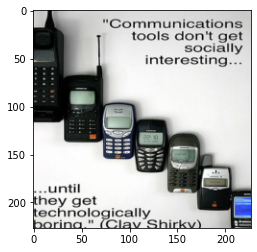

In [6]:
train_object.show_example(10)
len(train_object)

tensor(0.7353)


9999

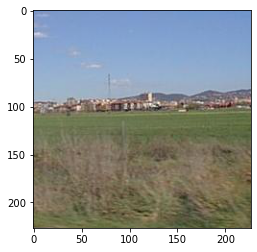

In [7]:
test_object.show_example(8)
len(test_object)

tensor(0.7073)


3740

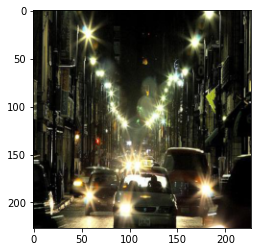

In [8]:
val_object.show_example(100)
len(val_object)

In [9]:
batch_size = 128
epochs = 256
to_pil = T.ToPILImage()

In [10]:
train_dataloader = DataLoader(train_object, batch_size, shuffle=True, pin_memory=True, drop_last=True)
test_dataloader = DataLoader(test_object, batch_size, shuffle=True, pin_memory=True, drop_last=True)
val_dataloader = DataLoader(val_object, batch_size, shuffle=True, pin_memory=True, drop_last=True)

In [11]:
find_worst_image = DataLoader(test_object, 1, shuffle=True, pin_memory=True, drop_last=True)

In [12]:
def show_batch(dl):
    for images, labels in dl:
        fig, ax = plt.subplots(figsize=(12, 12))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(images, nrow=8).permute(1, 2, 0))
        break

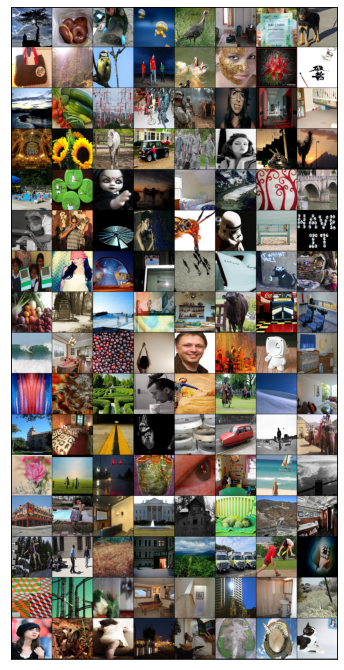

In [13]:
show_batch(val_dataloader)

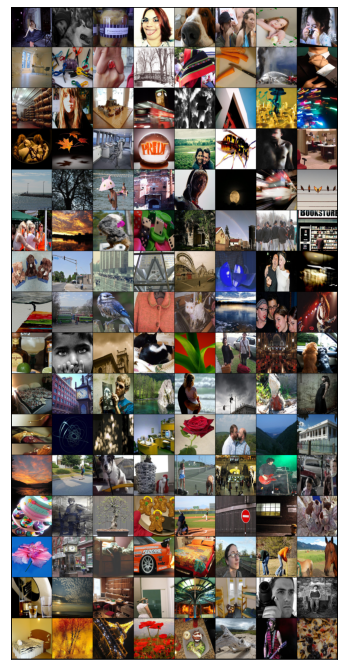

In [14]:
show_batch(train_dataloader)

## MemCat Dataset 

In [18]:
class MemCat(Dataset):
    attribute = ["mem_score"]
    
    def __init__(self, image_dir, path_to_filelabels, first_col, second_col):
        
        self.image_dir = image_dir
        self.path_to_filelabels = path_to_filelabels
        self.first_col = first_col
        self.second_col = second_col
        
        self.transform = T.Compose((T.Resize((256, 256)),T.CenterCrop(227),T.ToTensor()))
        
        self.path_to_imgs, self.img_name_list, self.labels_list = self.load_data(self.image_dir, self.path_to_filelabels, self.first_col, self.second_col)
        
    def __len__(self):
        return len(self.img_name_list)

    def __getitem__(self, index):
        image = Image.open(self.path_to_imgs[index]).convert("RGB")
        image = self.transform(image)
        labels = torch.FloatTensor(self.labels_list)
        return image, labels[index]
    
    def show_example(self, index):
        image, label = self.__getitem__(index)
        print(label)
        plt.imshow(image.permute(1, 2, 0))

    def load_data(self, image_dir, labels_collection, first_col, second_col):
        labels_collection[first_col] = labels_collection[first_col].str.split('/', n=4, expand=True).iloc[:, 4]
        labels_collection[first_col] = labels_collection[first_col].str.split('/').str[-1]
        img_name_list =[]
        labels_list = []
        labels_collection.reset_index()
        for index, row in labels_collection.iterrows():
            img_name_list.append(row[first_col])
            labels_list.append(row[second_col])
        files = [os.path.join(image_dir, f) for f in labels_collection[first_col]]
        labels = np.asarray(labels_collection)
        return files, img_name_list, labels_list
        


### The following lines have to be reactivated 

In [21]:
#files = zf.ZipFile("/Users/jeannieyoo/Downloads/MemCat_images/MemCat.zip", 'r')
#files.extractall('MemCat')
#files.close()

In [14]:
#direct = "MemCat/animal"
#current_folder = "MemCat/" 
  
# list of folders to be merged
#list_dir = ['bear', 'cat', 'chicken', 'cow', 'deer', 'dog', 'duck', 'elephant', 'fox', 
#            'giraffe', 'hamster', 'horse','lion', 'marten', 'mouse', 'pigeon', 'rabbit', 'sheep', 'squirrel',
#            'wild boar', 'zebra']
  
# enumerate on list_dir to get the 
# content of all the folders ans store it in a dictionary
#content_list = {}
#for index, val in enumerate(list_dir):
#    path = os.path.join(direct, val)
#    content_list[ list_dir[index] ] = os.listdir(path)

In [15]:
# Function to create new folder if not exists
#def make_new_folder(folder_name, parent_folder_path):
      
    # Path
#    path = os.path.join(parent_folder_path, folder_name)
      
    # Create the folder
    # 'new_folder' in
    # parent_folder
#    try: 
        
        # mode of the folder
#        mode = 0o777
  
        # Create folder
#        os.mkdir(path, mode) 
          
#    except OSError as error: 
#        print(error)

In [15]:
#merge_folder = "merge_folder"
  
# merge_folder path - current_folder 
# + merge_folder
#merge_folder_path = os.path.join(direct, merge_folder) 
  
# create merge_folder if not exists
#make_new_folder(merge_folder, direct)

In [16]:
#for sub_dir in content_list:
  
    # loop through the contents of the
    # list of folders
#    for contents in content_list[sub_dir]:
  
        # make the path of the content to move 
#        path_to_content = sub_dir + "/" + contents  
  
        # make the path with the current folder
#        dir_to_move = os.path.join(direct, path_to_content )
  
        # move the file
 #       shutil.move(dir_to_move, merge_folder_path)

In [19]:
db_animal = "MemCat/animal"
path_to_images_ = db_animal+"/merge_folder"
path_to_filenames_animal_testing = "MemCat"+"/memcat_animal_test_data.txt"

labels_score_animal_testing = pd.read_csv(path_to_filenames_animal_testing, delimiter=",")
labels_score_animal_testing.rename(columns = {'path/to/images/animal/lion/n02129165_10937.jpg':'n02129165_10937.jpg'}, inplace = True)
test_object_animal = MemCat(path_to_images_, labels_score_animal_testing, first_col='n02129165_10937.jpg', second_col='0.824742268041237')

tensor(0.9579)


199

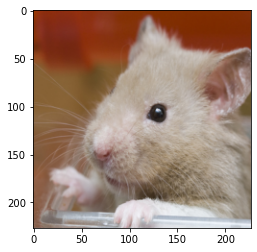

In [20]:
test_object_animal.show_example(10)
len(test_object_animal)

### The following lines have to be reactivated 

In [45]:
list_dir = ["apple", "bagel", "banana", "barbecue", "bell pepper", "bread", "breakfast", "broccoli", "burrito", "butternut squash", "cake",
"champagne", "cheese", "cocktail", "coffee", "donut", "gravy", "hotdog", "juice", "mashed potato", "muffin", "orange", "pasta",
"pizza", "salad", "sandwich", "soup", "tea", "yogurt", "zucchini"]

In [46]:
#direct = "MemCat/food"
#current_folder = "MemCat/" 
  
# list of folders to be merged
# ['bear', 'cat', 'chicken', 'cow', 'deer', 'dog', 'duck', 'elephant', 'fox', 
#            'giraffe', 'hamster', 'horse','lion', 'marten', 'mouse', 'pigeon', 'rabbit', 'sheep', 'squirrel',
#            'wild boar', 'zebra']
  
# enumerate on list_dir to get the 
# content of all the folders ans store it in a dictionary
#content_list = {}
#for index, val in enumerate(list_dir):
#    path = os.path.join(direct, val)
#    content_list[ list_dir[index] ] = os.listdir(path)

In [21]:
#merge_folder = "merge_folder"
  
# merge_folder path - current_folder 
# + merge_folder
#merge_folder_path = os.path.join(direct, merge_folder) 
  
# create merge_folder if not exists
#make_new_folder(merge_folder, direct)

In [48]:
#for sub_dir in content_list:
  
    # loop through the contents of the
    # list of folders
#    for contents in content_list[sub_dir]:
  
        # make the path of the content to move 
#        path_to_content = sub_dir + "/" + contents  
  
        # make the path with the current folder
#        dir_to_move = os.path.join(direct, path_to_content )
  
        # move the file
#        shutil.move(dir_to_move, merge_folder_path)

In [22]:
db_food = "MemCat/food"
path_to_images_ = db_food+"/merge_folder"
path_to_filenames_food = "MemCat"+"/memcat_food_test_data.txt"

labels_score_food_testing = pd.read_csv(path_to_filenames_food, delimiter=",")
labels_score_food_testing.rename(columns = {'path/to/images/food/hotdog/n07697537_29834.jpg':'n07697537_29834.jpg'}, inplace = True)
test_object_food = MemCat(path_to_images_, labels_score_food_testing, first_col='n07697537_29834.jpg', second_col='0.957894736842105')

tensor(0.7549)


199

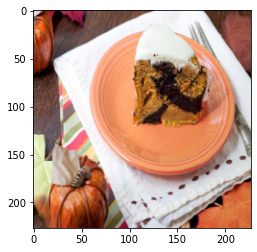

In [23]:
test_object_food.show_example(8)
len(test_object_food)

### The following lines have to be reactivated

In [53]:
list_dir =[ "American football", "archery", "baseball", "basketball", "bicycling racing", "boxing", "climbing", "cricket", 
"fencing", "field hockey", "figure skating", "fitness", "frisbee", "golf", "gymnastics", "ice hockey", "japanese martial arts", 
"karate", "lacrosse", "mountain biking", "roller skating", "rowing", "rugby", "skateboarding", "skiing", "snowboarding",
"soccer", "surfing", "swimming", "tennis", "track and field", "volleyball"]

In [54]:
#direct = "MemCat/sports"
#current_folder = "MemCat/" 
  
# list of folders to be merged
#
# enumerate on list_dir to get the 
# content of all the folders ans store it in a dictionary
#content_list = {}
#for index, val in enumerate(list_dir):
#    path = os.path.join(direct, val)
#    content_list[ list_dir[index] ] = os.listdir(path)

In [24]:
#merge_folder = "merge_folder"
  
# merge_folder path - current_folder 
# + merge_folder
#merge_folder_path = os.path.join(direct, merge_folder) 
  
# create merge_folder if not exists
#make_new_folder(merge_folder, direct)

In [25]:
#for sub_dir in content_list:
  
    # loop through the contents of the
    # list of folders
#    for contents in content_list[sub_dir]:
  
        # make the path of the content to move 
#        path_to_content = sub_dir + "/" + contents  
  
        # make the path with the current folder
#        dir_to_move = os.path.join(direct, path_to_content )
  
        # move the file
#        shutil.move(dir_to_move, merge_folder_path)

In [26]:
db_sports = "MemCat/sports"
path_to_images_ = db_sports+"/merge_folder"
path_to_filenames_sports = "MemCat"+"/memcat_sports_test_data.txt"

labels_score_sports_testing = pd.read_csv(path_to_filenames_sports, delimiter=",")
labels_score_sports_testing.rename(columns = {'path/to/images/sports/rowing/n00445351_11520.jpg':'n00445351_11520.jpg'}, inplace = True)
test_object_sports = MemCat(path_to_images_, labels_score_sports_testing, first_col='n00445351_11520.jpg', second_col='0.868686868686869')

tensor(0.7339)


199

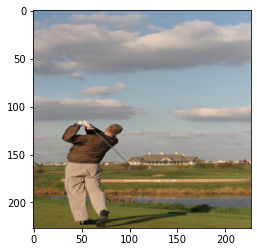

In [27]:
test_object_sports.show_example(8)
len(test_object_sports)

In [62]:
list_dir = ["badlands", "barn", "creek", "desert", "field", "forest (broadleaf)", "forest (needleleaf)", "geyser", "icescape", 
"jungle", "lake", "mangrove", "moor", "mountain", "pasture", "plantation", "river", "savanna", "sea", "shore", "snowscape",
"tundra", "valley", "volcano", "waterfall", "wetland", "windmill"]

In [28]:
#direct = "MemCat/landscape"
#current_folder = "MemCat/" 
  
# list of folders to be merged
# ['bear', 'cat', 'chicken', 'cow', 'deer', 'dog', 'duck', 'elephant', 'fox', 
#            'giraffe', 'hamster', 'horse','lion', 'marten', 'mouse', 'pigeon', 'rabbit', 'sheep', 'squirrel',
#            'wild boar', 'zebra']
  
# enumerate on list_dir to get the 
# content of all the folders ans store it in a dictionary
#content_list = {}
#for index, val in enumerate(list_dir):
#    path = os.path.join(direct, val)
#    content_list[ list_dir[index] ] = os.listdir(path)

In [29]:
#merge_folder = "merge_folder"
  
# merge_folder path - current_folder 
# + merge_folder
#merge_folder_path = os.path.join(direct, merge_folder) 
  
# create merge_folder if not exists
#make_new_folder(merge_folder, direct)

In [30]:
#for sub_dir in content_list:
  
    # loop through the contents of the
    # list of folders
#    for contents in content_list[sub_dir]:
  
        # make the path of the content to move 
#        path_to_content = sub_dir + "/" + contents  
  
        # make the path with the current folder
#        dir_to_move = os.path.join(direct, path_to_content )
  
        # move the file
#        shutil.move(dir_to_move, merge_folder_path)

In [31]:
db_land = "MemCat/landscape"
path_to_images_ = db_land+"/merge_folder"
path_to_filenames_land = "MemCat"+"/memcat_landscape_test_data.txt"

labels_score_land_testing = pd.read_csv(path_to_filenames_land, delimiter=",")
labels_score_land_testing.rename(columns = {'path/to/images/landscape/plantation/eef37194bf91e872.jpg':'eef37194bf91e872.jpg'}, inplace = True)
test_object_land = MemCat(path_to_images_, labels_score_land_testing, first_col='eef37194bf91e872.jpg', second_col='0.620253164556962')

tensor(0.7222)


199

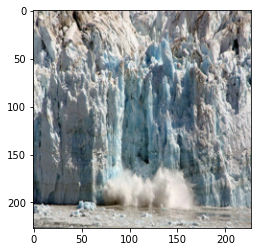

In [32]:
test_object_land.show_example(8)
len(test_object_land)

# Geiger-Balas Dataset

In [33]:
#files = zf.ZipFile("/Users/jeannieyoo/Downloads/osfstorage-archive 2.zip", 'r')
#files.extractall('GB')
#files.close()

In [34]:
class GB(Dataset):
    attribute = ["mem_score"]
    
    def __init__(self, image_dir, path_to_filelabels, first_col, second_col):
        
        self.image_dir = image_dir
        self.path_to_filelabels = path_to_filelabels
        self.first_col = first_col
        self.second_col = second_col
        
        self.transform = T.Compose((T.Resize((256, 256)),T.CenterCrop(227),T.ToTensor()))
        
        self.path_to_imgs, self.img_name_list, self.labels_list = self.load_data(self.image_dir, self.path_to_filelabels, self.first_col, self.second_col)
        
    def __len__(self):
        return len(self.img_name_list)

    def __getitem__(self, index):
        image = Image.open(self.path_to_imgs[index]).convert("RGB")
        image = self.transform(image)
        labels = torch.FloatTensor(self.labels_list)
        return image, labels[index]
    
    def show_example(self, index):
        image, label = self.__getitem__(index)
        print(label)
        plt.imshow(image.permute(1, 2, 0))

    def load_data(self, image_dir, labels_collection, first_col, second_col):
        img_name_list =[]
        labels_list = []
        labels_collection.reset_index()
        for index, row in labels_collection.iterrows():
            img_name_list.append(row[first_col])
            labels_list.append(row[second_col])
        files = [os.path.join(image_dir, f) for f in labels_collection[first_col]]
        labels = np.asarray(labels_collection)
        return files, img_name_list, labels_list
        


In [35]:
db_gb = "GB/osfstorage-archive"
path_to_images_gb = db_gb+"/STIM"
path_to_filename = "GB/osfstorage-archive/output.txt"

In [36]:
#Cropping the images
def CropImage(image_name):
    original = Image.open(image_name)

    width, height = original.size

    wid = int(width / 2)

    img_left = original.crop((0, 0, wid, height))
    img_right = original.crop((wid, 0, width, height))

    i = re.findall(r'\d+', image_name)[0]
    name_right = "{img_name}A.jpg".format(img_name=i)
    name_left = "{img_name}B.jpg".format(img_name=i)
    
    img_right.save(name_right)
    img_left.save(name_left)

In [37]:
for img in os.listdir(path_to_images_gb):
    CropImage(path_to_images_gb + "/" + img)

In [38]:
path_to_images_gb = db_gb+"/STIM_cropped"

In [39]:
labels_collection = pd.read_csv(path_to_filename, delimiter=" ")
labels_collection.columns = labels_collection.iloc[0]
labels_collection = labels_collection[1:]

# add ".jpg" extension to each image name
labels_collection['1A'] = labels_collection['1A'].apply(lambda x: x + '.jpg')

In [40]:
labels_collection.rename(columns = {'1A':'1A.jpg'}, inplace = True)
test_faces = GB(path_to_images_gb, labels_collection, first_col='1A.jpg', second_col=0.787)

tensor(0.7860)


55

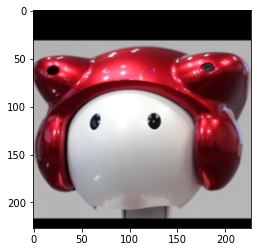

In [41]:
test_faces.show_example(8)
len(test_faces)

# Models

In [47]:
def conv_block(in_channels, out_channels, stride=1):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True),
        nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True),
    )

class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=1),
            conv_block(64, 64),
            conv_block(64, 64),
            conv_block(64, 64),
            conv_block(64, 128, stride=2),
            conv_block(128, 128),
            conv_block(128, 128),
            conv_block(128, 128),
            conv_block(128, 256, stride=2),
            conv_block(256, 256),
            conv_block(256, 256),
            conv_block(256, 256),
            conv_block(256, 256),
            conv_block(256, 256),
            conv_block(256, 512, stride=2),
            conv_block(512, 512),
            conv_block(512, 512),
            conv_block(512, 512),
            conv_block(512, 512),
            conv_block(512, 512),
            conv_block(512, 512),
            conv_block(512, 512),
            conv_block(512, 1000),
            nn.AdaptiveAvgPool2d((1, 1)),
        )
        self.classifier = nn.Linear(1000, 1000)

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

net = SimpleCNN()
print("Number of parameters: ", sum(p.numel() for p in net.parameters()))

Number of parameters:  59327048


In [43]:
class ResMem(nn.Module):
    def __init__(self, learning_rate=1e-5, momentum=.9, cruise_altitude=384, pretrained=False):
        super().__init__()

        self.features = resnet152(pretrained=not pretrained)
        for param in self.features.parameters():
            param.requires_grad = False

        self.conv1 = nn.Conv2d(3, 48, kernel_size=11, stride=4)
        self.pool1 = nn.MaxPool2d(3, 2)
        self.lrn1 = nn.LocalResponseNorm(5)
        self.conv2 = nn.Conv2d(48, 256, kernel_size=5, stride=1, padding=2, groups=2)
        self.pool2 = nn.MaxPool2d(3, 2)
        self.lrn2 = nn.LocalResponseNorm(5)
        self.conv3 = nn.Conv2d(256, cruise_altitude, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=2)
        self.conv4 = nn.Conv2d(cruise_altitude, cruise_altitude, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1),
                               groups=2)
        self.conv5 = nn.Conv2d(cruise_altitude, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=2)
        self.pool5 = nn.MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)

        self.fc6 = nn.Linear(in_features=9216 + 1000, out_features=4096, bias=True)
        self.drp6 = nn.Dropout(p=0.5, inplace=False)
        self.fc7 = nn.Linear(in_features=4096, out_features=4096, bias=True)
        self.drp7 = nn.Dropout(p=0.5, inplace=False)
        self.fc8 = nn.Linear(in_features=4096, out_features=2048, bias=True)
        self.drp8 = nn.Dropout(p=0.5, inplace=False)
        self.fc9 = nn.Linear(in_features=2048, out_features=1024, bias=True)
        self.fc10 = nn.Linear(in_features=1024, out_features=512, bias=True)
        self.fc11 = nn.Linear(in_features=512, out_features=256, bias=True)
        self.fc12 = nn.Linear(in_features=256, out_features=1, bias=True)

        self.learning_rate = learning_rate

    def forward(self, x):
        intermediate_outputs = []
        
        cnv = f.relu(self.conv1(x))
        
        intermediate_outputs.append(cnv) #Layer 1
        
        cnv = self.pool1(cnv)
        
        intermediate_outputs.append(cnv) #Layer 2
        
        cnv = self.lrn1(cnv)
        
        intermediate_outputs.append(cnv) #Layer 3
        
        cnv = f.relu(self.conv2(cnv))
        cnv = self.pool2(cnv)
        
        intermediate_outputs.append(cnv) #Layer 4
        
        cnv = self.lrn2(cnv)
        
        intermediate_outputs.append(cnv) #Layer 5       
        
        cnv = f.relu(self.conv3(cnv))
        cnv = f.relu(self.conv4(cnv))
        cnv = f.relu(self.conv5(cnv))
        cnv = self.pool5(cnv)
        
        intermediate_outputs.append(cnv) #Layer 6
        
        feat = cnv.view(-1, 9216)
        resfeat = self.features(x)
        catfeat = torch.cat((feat, resfeat), 1)
        
        intermediate_outputs.append(catfeat) #Layer 7 _ ResNet layer 

        hid = f.relu(self.fc6(catfeat))
        hid = self.drp6(hid)
        
        intermediate_outputs.append(cnv)  #Layer 8 
        
        hid = f.relu(self.fc7(hid))
        hid = self.drp8(hid)
        
        intermediate_outputs.append(hid) #Layer 9 
        
        hid = f.relu(self.fc8(hid))
        hid = f.relu(self.fc9(hid))
        hid = f.relu(self.fc10(hid))
        hid = f.relu(self.fc11(hid))

        pry = torch.sigmoid(self.fc12(hid)) #Layer 10

        return pry, intermediate_outputs

In [44]:
class ResMem_noRes(nn.Module):
    def __init__(self, learning_rate=1e-5, momentum=.9, cruise_altitude=384, pretrained=False):
        super().__init__()

        self.features = SimpleCNN()
        for param in self.features.parameters():
            param.requires_grad = False

        self.conv1 = nn.Conv2d(3, 48, kernel_size=11, stride=4)
        self.pool1 = nn.MaxPool2d(3, 2)
        self.lrn1 = nn.LocalResponseNorm(5)
        self.conv2 = nn.Conv2d(48, 256, kernel_size=5, stride=1, padding=2, groups=2)
        self.pool2 = nn.MaxPool2d(3, 2)
        self.lrn2 = nn.LocalResponseNorm(5)
        self.conv3 = nn.Conv2d(256, cruise_altitude, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=2)
        self.conv4 = nn.Conv2d(cruise_altitude, cruise_altitude, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1),
                               groups=2)
        self.conv5 = nn.Conv2d(cruise_altitude, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=2)
        self.pool5 = nn.MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)

        self.fc6 = nn.Linear(in_features=9216 + 1000, out_features=4096, bias=True)
        self.drp6 = nn.Dropout(p=0.5, inplace=False)
        self.fc7 = nn.Linear(in_features=4096, out_features=4096, bias=True)
        self.drp7 = nn.Dropout(p=0.5, inplace=False)
        self.fc8 = nn.Linear(in_features=4096, out_features=2048, bias=True)
        self.drp8 = nn.Dropout(p=0.5, inplace=False)
        self.fc9 = nn.Linear(in_features=2048, out_features=1024, bias=True)
        self.fc10 = nn.Linear(in_features=1024, out_features=512, bias=True)
        self.fc11 = nn.Linear(in_features=512, out_features=256, bias=True)
        self.fc12 = nn.Linear(in_features=256, out_features=1, bias=True)

        self.learning_rate = learning_rate

    def forward(self, x):
        intermediate_outputs = []
        
        cnv = f.relu(self.conv1(x))
        
        intermediate_outputs.append(cnv) #Layer 1
        
        cnv = self.pool1(cnv)
        
        intermediate_outputs.append(cnv) #Layer 2
        
        cnv = self.lrn1(cnv)
        
        intermediate_outputs.append(cnv) #Layer 3
        
        cnv = f.relu(self.conv2(cnv))
        cnv = self.pool2(cnv)
        
        intermediate_outputs.append(cnv) #Layer 4
        
        cnv = self.lrn2(cnv)
        
        intermediate_outputs.append(cnv) #Layer 5       
        
        cnv = f.relu(self.conv3(cnv))
        cnv = f.relu(self.conv4(cnv))
        cnv = f.relu(self.conv5(cnv))
        cnv = self.pool5(cnv)
        
        intermediate_outputs.append(cnv) #Layer 6
        
        feat = cnv.view(-1, 9216)
        resfeat = self.features(x)
        catfeat = torch.cat((feat, resfeat), 1)
        
        intermediate_outputs.append(catfeat) #Layer 7 _ ResNet layer 

        hid = f.relu(self.fc6(catfeat))
        hid = self.drp6(hid)
        
        intermediate_outputs.append(cnv)  #Layer 8 
        
        hid = f.relu(self.fc7(hid))
        hid = self.drp8(hid)
        
        intermediate_outputs.append(hid) #Layer 9 
        
        hid = f.relu(self.fc8(hid))
        hid = f.relu(self.fc9(hid))
        hid = f.relu(self.fc10(hid))
        hid = f.relu(self.fc11(hid))

        pry = torch.sigmoid(self.fc12(hid)) #Layer 10

        return pry, intermediate_outputs

In [45]:
model = ResMem()
device = torch.device("mps") # Rewrite these lines if run on CUDA
model = model.to(device) # --

In [48]:
model2 = ResMem_noRes()
device = torch.device("mps") # --
model2 = model2.to(device) # --

# Training ResMem Model

In [14]:
train_losses = []
val_losses = []
loss_fn = nn.MSELoss()
opt = torch.optim.Adam(params=model.parameters(), lr=0.0001)
test_loss = 0.0

In [15]:
pbar = tqdm(enumerate(train_dataloader), total=len(train_dataloader))

print("Beginning training ...")

for epoch in range(epochs):
    model.train(True) # Change model to 'train' mode
    for batch_ndx, (images, score) in pbar:

        # Forward + Backward + Optimize
        opt.zero_grad()
        images = images.to(device) # -- 
        score = score.to(device) # -- 
        y_pred, _ = model(images)
        loss = loss_fn(y_pred.squeeze(),score)
        loss.backward()
        opt.step()
        
        train_losses.append(loss)

  0%|          | 0/351 [00:00<?, ?it/s]

Beginning training ...


100%|██████████| 351/351 [32:42<00:00,  5.59s/it]


## Plotting the Training Loss 

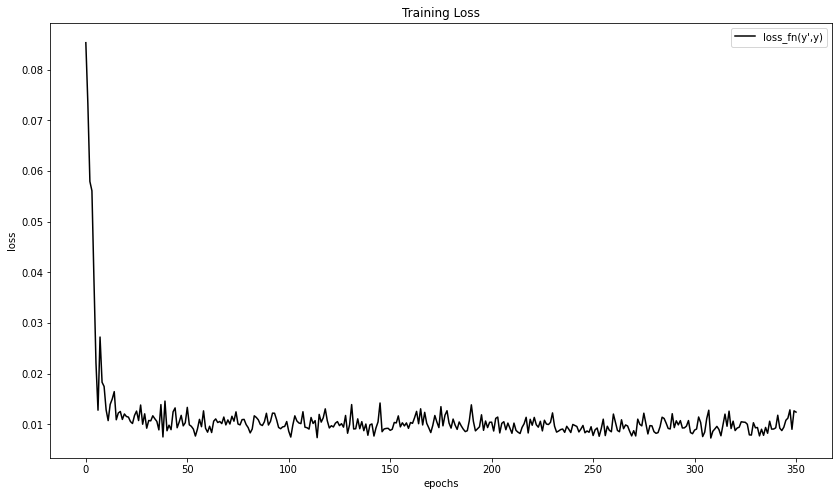

In [16]:
plt.figure(figsize=(14, 8))
plt.plot([x for x in range(351)], [x.cpu().detach().numpy() for x in train_losses], c = "black", label = r"loss_fn(y',y)")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title("Training Loss")
plt.legend()
plt.savefig("COG403tl.png")

In [72]:
pbar = tqdm(enumerate(val_dataloader), total=len(val_dataloader))
val_losses = []
print("Beginning training ...")
 
for epoch in range(epochs):
    model.eval()
    for batch_ndx, (images, score) in pbar:
        with torch.no_grad():
            images = images.to(device) # -- 
            score = score.to(device) # -- 

            y_pred, _ = model(images)
            loss = loss_fn(y_pred.squeeze(),score)
            val_losses.append(loss)

  0%|          | 0/29 [00:00<?, ?it/s]

Beginning training ...


100%|██████████| 29/29 [01:42<00:00,  3.52s/it]


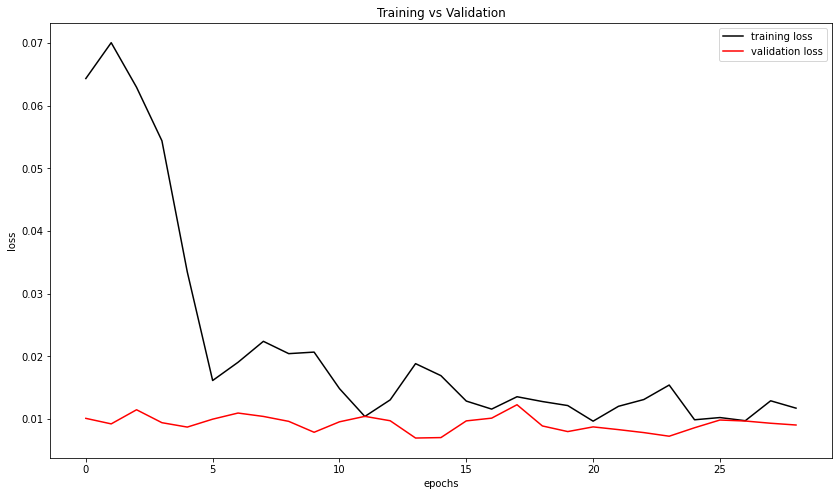

In [73]:
plt.figure(figsize=(14, 8))
plt.plot([x for x in range(29)], [x.cpu().detach().numpy() for x in train_losses[:29]], c = "black", label = "training loss")
plt.plot([x for x in range(29)], [x.cpu().detach().numpy() for x in val_losses], c = "red", label = "validation loss")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title("Training vs Validation")
plt.legend()

# Training ResMem_NoRes Model

In [36]:
train_losses_nores = []

opt = torch.optim.Adam(params=model2.parameters(), lr=0.0001)
pbar = tqdm(enumerate(train_dataloader), total=len(train_dataloader))

print("Beginning training ...")
model2 = model2.to(device)
for epoch in range(epochs):
    model2.train(True) # Change model to 'train' mode
    for batch_ndx, (images, score) in pbar:
        # image_val, score_val = next(temp)
        # image_val = image_val.to(device)
        # score_val = score_val.to(device)

        # Forward + Backward + Optimize
        opt.zero_grad()
        images = images.to(device) # -- 
        score = score.to(device) # -- 

        y_pred, _ = model2(images)
        
        loss = loss_fn(y_pred.squeeze(),score)
        loss.backward()
        opt.step()
        
        train_losses_nores.append(loss)

  0%|          | 0/351 [00:00<?, ?it/s]

Beginning training ...


100%|██████████| 351/351 [10:00<00:00,  1.71s/it]


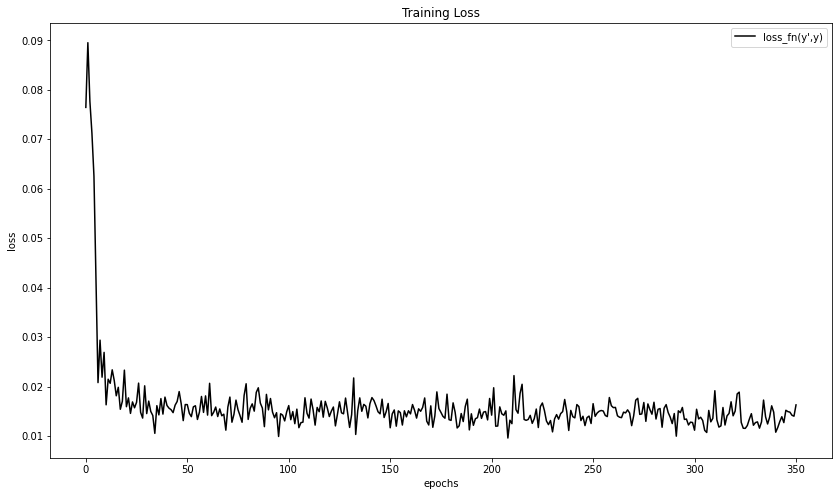

In [40]:
plt.figure(figsize=(14, 8))
plt.plot([x for x in range(351)], [x.cpu().detach().numpy() for x in train_losses_nores], c = "black", label = r"loss_fn(y',y)")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title("Training Loss")
plt.legend()
plt.savefig("COG403tl.png")

# Testing Both Models

## ResMem Model

In [86]:
pbar = tqdm(enumerate(test_dataloader), total=len(test_dataloader))
test_losses = []
labels = []
prediction = []
print("Beginning testing ...")
 
model = model.to(device)

for epoch in range(epochs):
    model.eval()
    for batch_ndx, (images, score) in pbar:
        with torch.no_grad():
            labels.append(score)
            images = images.to(device) # -- 
            score = score.to(device) # -- 

            y_pred, lab = model(images)
            prediction.append(y_pred.squeeze())
        
            loss = loss_fn(y_pred.squeeze(),score)
        
            test_losses.append(loss)

  0%|          | 0/78 [00:00<?, ?it/s]

Beginning testing ...


100%|██████████| 78/78 [05:35<00:00,  4.30s/it]


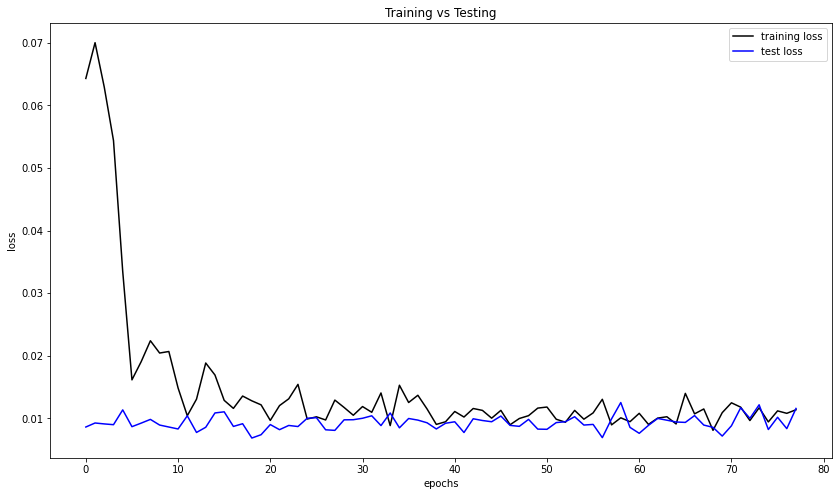

In [87]:
plt.figure(figsize=(14, 8))
plt.plot([x for x in range(78)], [x.cpu().detach().numpy() for x in train_losses[:78]], c = "black", label = "training loss")
plt.plot([x for x in range(78)], [x.cpu().detach().numpy() for x in test_losses], c = "blue", label = r"test loss")
plt.xlabel("epochs")
plt.title("Training vs Testing")
plt.ylabel("loss")
plt.legend()

## ResMem_NoRes Model 

In [26]:
pbar = tqdm(enumerate(test_dataloader), total=len(test_dataloader))
test_losses_nores = []
labels_nores = []
prediction_nores = []
print("Beginning testing ...")
 
for epoch in range(epochs):
    model2.eval()
    for batch_ndx, (images, score) in pbar:
        with torch.no_grad():
            labels_nores.append(score)
            images = images.to(device) # -- 
            score = score.to(device) # -- 

            y_pred, lab = model2(images)
            prediction_nores.append(y_pred.squeeze())
            
        
            loss = loss_fn(y_pred.squeeze(),score)
        
            test_losses_nores.append(loss)

  0%|          | 0/9999 [00:33<?, ?it/s]

Beginning testing ...


NameError: name 'model2' is not defined

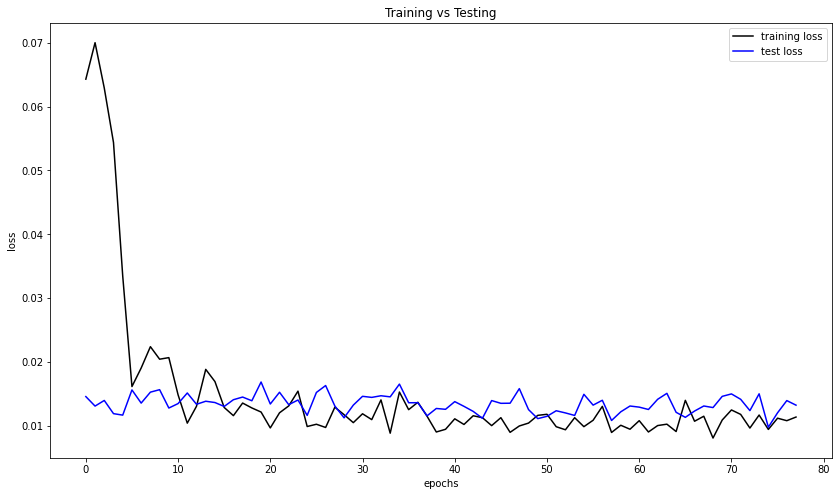

In [89]:
plt.figure(figsize=(14, 8))
plt.plot([x for x in range(78)], [x.cpu().detach().numpy() for x in train_losses[:78]], c = "black", label = "training loss")
plt.plot([x for x in range(78)], [x.cpu().detach().numpy() for x in test_losses_nores], c = "blue", label = r"test loss")
plt.xlabel("epochs")
plt.title("Training vs Testing")
plt.ylabel("loss")
plt.legend()

# Statistical Analysis

## Spearman Correlation 

### ResMem Model 

In [302]:
labels[0][0].item()

IndexError: invalid index to scalar variable.

In [91]:
true_score = []
for batch in labels:
    for score in batch:
        true_score.append(score.item())
print(len(true_score))

9984


In [92]:
pred_score = []
for batch in prediction:
    for score in batch:
        pred_score.append(score.item())
print(len(pred_score))

9984


Spearman correlation: 0.6236862592693991
p-value: 0.0


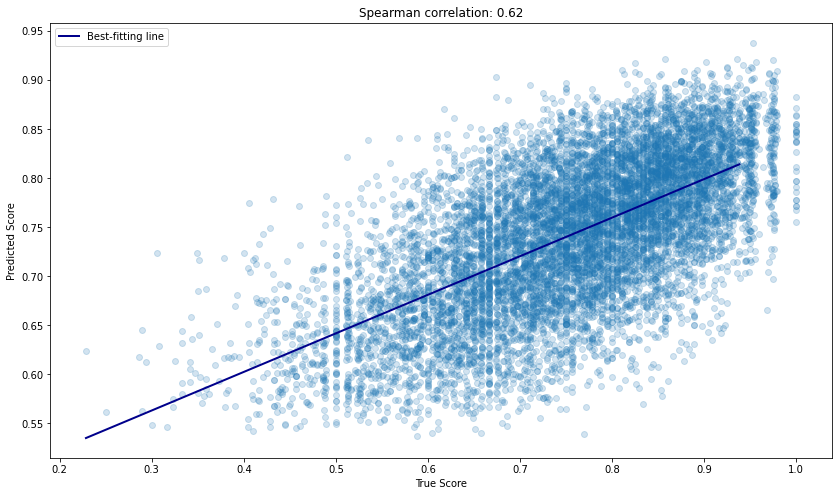

In [93]:
correlation, p_value = spearmanr(true_score, pred_score)
slope, intercept, r_value, p_value, std_err = linregress(true_score, pred_score)

print("Spearman correlation:", correlation)
print("p-value:", p_value)

plt.figure(figsize=(14, 8)) 
x_values = np.linspace(np.min(true_score), np.max(pred_score), 100)
y_values = slope * x_values + intercept
plt.plot(x_values, y_values, color="#00008B", linewidth=2, label='Best-fitting line')

plt.scatter(true_score, pred_score, cmap='viridis', alpha = 0.2)

# Add labels and title
plt.xlabel("True Score")
plt.ylabel("Predicted Score")
plt.title(f"Spearman correlation: {correlation:.2f}")
plt.legend()

# Display the plot
plt.show()

### ResMem_NoRes 

In [94]:
true_score = []
for batch in labels_nores:
    for score in batch:
        true_score.append(score.item())
print(len(true_score))

9984


In [95]:
pred_score = []
for batch in prediction_nores:
    for score in batch:
        pred_score.append(score.item())
print(len(pred_score))

9984


Spearman correlation: 0.4128130545089925
p-value: 0.0


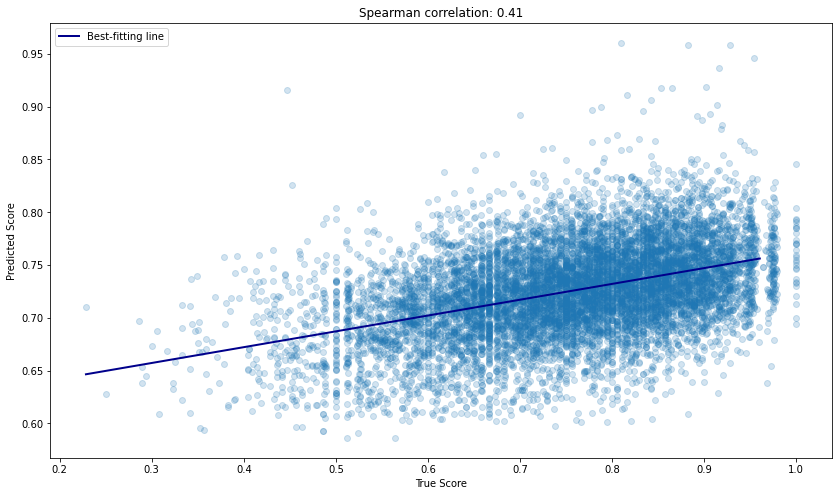

In [96]:
correlation, p_value = spearmanr(true_score, pred_score)
slope, intercept, r_value, p_value, std_err = linregress(true_score, pred_score)

print("Spearman correlation:", correlation)
print("p-value:", p_value)

plt.figure(figsize=(14, 8)) 
x_values = np.linspace(np.min(true_score), np.max(pred_score), 100)
y_values = slope * x_values + intercept
plt.plot(x_values, y_values, color="#00008B", linewidth=2, label='Best-fitting line')

plt.scatter(true_score, pred_score, cmap='viridis', alpha = 0.2)

# Add labels and title
plt.xlabel("True Score")
plt.ylabel("Predicted Score")
plt.title(f"Spearman correlation: {correlation:.2f}")
plt.legend()

# Display the plot
plt.show()

# Testing on Contrained Datasets

In [49]:
#model.load_state_dict(torch.load("saved_model.pt"))
#model.eval()

In [307]:
epochs = 50
model = model.to(device)
model2 = model2.to(device)

In [304]:
test_dl_sports = DataLoader(test_object_sports, 8, shuffle=True, pin_memory=True, drop_last=True)
test_dl_animal = DataLoader(test_object_animal, 8, shuffle=True, pin_memory=True, drop_last=True)
test_dl_food = DataLoader(test_object_food, 8, shuffle=True, pin_memory=True, drop_last=True)
test_dl_landscape = DataLoader(test_object_land, 8, shuffle=True, pin_memory=True, drop_last=True)

In [308]:
pbar = tqdm(enumerate(test_dl_animal), total=len(test_dl_animal))
test_losses_animal = []
labels_animal = []
prediction_animal = []
print("Beginning testing ...")
 
for epoch in range(epochs):
    model.eval()
    for batch_ndx, (images, score) in pbar:
        with torch.no_grad():
            labels_animal.append(score)
            images = images.to(device) # -- 
            score = score.to(device) # -- 

            y_pred, lab = model(images)
            prediction_animal.append(y_pred.squeeze())
            
        
            loss = loss_fn(y_pred.squeeze(),score)
        
            test_losses_animal.append(loss)

  0%|          | 0/24 [00:00<?, ?it/s]

Beginning testing ...


100%|██████████| 24/24 [00:09<00:00,  2.62it/s]


In [309]:
pbar = tqdm(enumerate(test_dl_sports), total=len(test_dl_sports))
test_losses_sport = []
labels_sport = []
prediction_sport = []
print("Beginning testing ...")
 
for epoch in range(epochs):
    model.eval()
    for batch_ndx, (images, score) in pbar:
        with torch.no_grad():
            labels_sport.append(score)
            images = images.to(device) # -- 
            score = score.to(device) # -- 

            y_pred, lab = model(images)
            prediction_sport.append(y_pred.squeeze())
            
        
            loss = loss_fn(y_pred.squeeze(),score)
        
            test_losses_sport.append(loss)

  0%|          | 0/24 [00:00<?, ?it/s]

Beginning testing ...


100%|██████████| 24/24 [00:09<00:00,  2.48it/s]


In [310]:
pbar = tqdm(enumerate(test_dl_food), total=len(test_dl_food))
test_losses_food = []
labels_food = []
prediction_food = []
print("Beginning testing ...")
 
for epoch in range(epochs):
    model.eval()
    for batch_ndx, (images, score) in pbar:
        with torch.no_grad():
            labels_food.append(score)
            images = images.to(device) # -- 
            score = score.to(device) # -- 

            y_pred, lab = model(images)
            prediction_food.append(y_pred.squeeze())
            
        
            loss = loss_fn(y_pred.squeeze(),score)
        
            test_losses_food.append(loss)

  0%|          | 0/24 [00:00<?, ?it/s]

Beginning testing ...


100%|██████████| 24/24 [00:09<00:00,  2.58it/s]


In [311]:
pbar = tqdm(enumerate(test_dl_landscape), total=len(test_dl_landscape))
test_losses_land = []
labels_land = []
prediction_land = []
print("Beginning testing ...")
 
for epoch in range(epochs):
    model.eval()
    for batch_ndx, (images, score) in pbar:
        with torch.no_grad():
            labels_land.append(score)
            images = images.to(device) # -- 
            score = score.to(device) # -- 

            y_pred, lab = model(images)
            prediction_land.append(y_pred.squeeze())
            
        
            loss = loss_fn(y_pred.squeeze(),score)
        
            test_losses_land.append(loss)

  0%|          | 0/24 [00:00<?, ?it/s]

Beginning testing ...


100%|██████████| 24/24 [00:08<00:00,  2.85it/s]


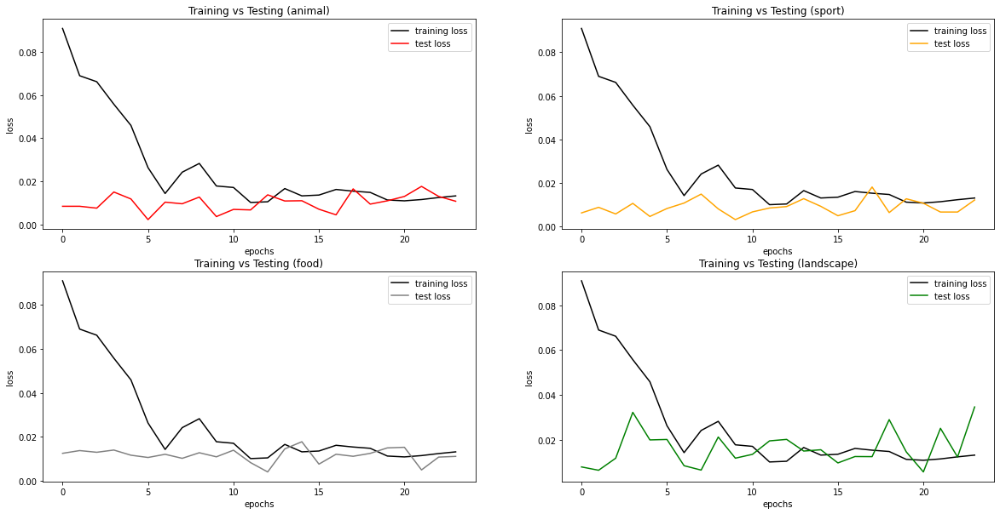

In [312]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
axes[0, 0].plot([x for x in range(24)], [x.cpu().detach().numpy() for x in train_losses[:24]], c = "black", label = "training loss")
axes[0, 0].plot([x for x in range(24)], [x.cpu().detach().numpy() for x in test_losses_animal], c = "red", label = r"test loss")
axes[0, 0].legend()
axes[0, 0].set_title("Training vs Testing (animal)")
axes[0, 1].plot([x for x in range(24)], [x.cpu().detach().numpy() for x in train_losses[:24]], c = "black", label = "training loss")
axes[0, 1].plot([x for x in range(24)], [x.cpu().detach().numpy() for x in test_losses_sport], c = "orange", label = r"test loss")
axes[0, 1].legend()
axes[0, 1].set_title("Training vs Testing (sport)")
axes[1, 0].plot([x for x in range(24)], [x.cpu().detach().numpy() for x in train_losses[:24]], c = "black", label = "training loss")
axes[1, 0].plot([x for x in range(24)], [x.cpu().detach().numpy() for x in test_losses_food], c = "grey", label = r"test loss")
axes[1, 0].legend()
axes[1, 0].set_title("Training vs Testing (food)")
axes[1, 1].plot([x for x in range(24)], [x.cpu().detach().numpy() for x in train_losses[:24]], c = "black", label = "training loss")
axes[1, 1].plot([x for x in range(24)], [x.cpu().detach().numpy() for x in test_losses_land], c = "green", label = r"test loss")
axes[1, 1].legend()
axes[1, 1].set_title("Training vs Testing (landscape)")
for ax in axes.flat:
    ax.set(xlabel='epochs', ylabel='loss')

## Spearman Correlation on Constrained Datasets 

In [313]:
true_score_animal = []
for batch in labels_animal:
    for score in batch:
        true_score_animal.append(score.item())
print(len(true_score_animal))


pred_score_animal = []
for batch in prediction_animal:
    for score in batch:
        pred_score_animal.append(score.item())
print(len(pred_score_animal))

correlation_an, p_value_an = spearmanr(true_score_animal,pred_score_animal)
slope1, intercept1, r_value1, p_value_an, std_err1 = linregress(true_score_animal,pred_score_animal)
print("Spearman correlation:", correlation_an)
print("p-value:", p_value_an)
x_values1 = np.linspace(np.min(true_score_animal), np.max(pred_score_animal), 100)
y_values1 = slope1 * x_values1 + intercept1

192
192
Spearman correlation: 0.34265075339904816
p-value: 1.882788973705325e-11


In [314]:
true_score_food = []
for batch in labels_food:
    for score in batch:
        true_score_food.append(score.item())
print(len(true_score_food))


pred_score_food = []
for batch in prediction_food:
    for score in batch:
        pred_score_food.append(score.item())
print(len(pred_score_food))

correlation_f, p_value_f = spearmanr(true_score_food,pred_score_food)
slope2, intercept2, r_value2, p_value_f, std_err2 = linregress(true_score_food,pred_score_food)

print("Spearman correlation:", correlation_f)
print("p-value:", p_value_f)
x_values2 = np.linspace(np.min(true_score_food), np.max(pred_score_food), 100)
y_values2 = slope2 * x_values2 + intercept2

192
192
Spearman correlation: 0.2764294428038941
p-value: 0.0005383898914254154


In [315]:
true_score_sport = []
for batch in labels_sport:
    for score in batch:
        true_score_sport.append(score.item())
print(len(true_score_sport))

pred_score_sport = []
for batch in prediction_sport:
    for score in batch:
        pred_score_sport.append(score.item())
print(len(pred_score_sport))

correlation_s, p_value_s = spearmanr(true_score_sport,pred_score_sport)
slope3, intercept3, r_value3, p_value_s, std_err3 = linregress(true_score_sport,pred_score_sport)


print("Spearman correlation:", correlation_s)
print("p-value:", p_value_s)
x_values3 = np.linspace(np.min(true_score_sport), np.max(pred_score_sport), 100)
y_values3 = slope3 * x_values3 + intercept3

192
192
Spearman correlation: 0.39385080472947825
p-value: 1.412747760218777e-09


In [316]:
true_score_land = []
for batch in labels_land:
    for score in batch:
        true_score_land.append(score.item())
print(len(true_score_land))

pred_score_land= []
for batch in prediction_land:
    for score in batch:
        pred_score_land.append(score.item())
print(len(pred_score_land))

correlation_l, p_value_l = spearmanr(true_score_land,pred_score_land)
slope4, intercept4, r_value4, p_value_l, std_err4 = linregress(true_score_land,pred_score_land)


print("Spearman correlation:", correlation_l)
print("p-value:", p_value_l)
x_values4 = np.linspace(np.min(true_score_land), np.max(pred_score_land), 100)
y_values4 = slope4 * x_values4 + intercept4

192
192
Spearman correlation: 0.4481524858315565
p-value: 2.8492468021411465e-12


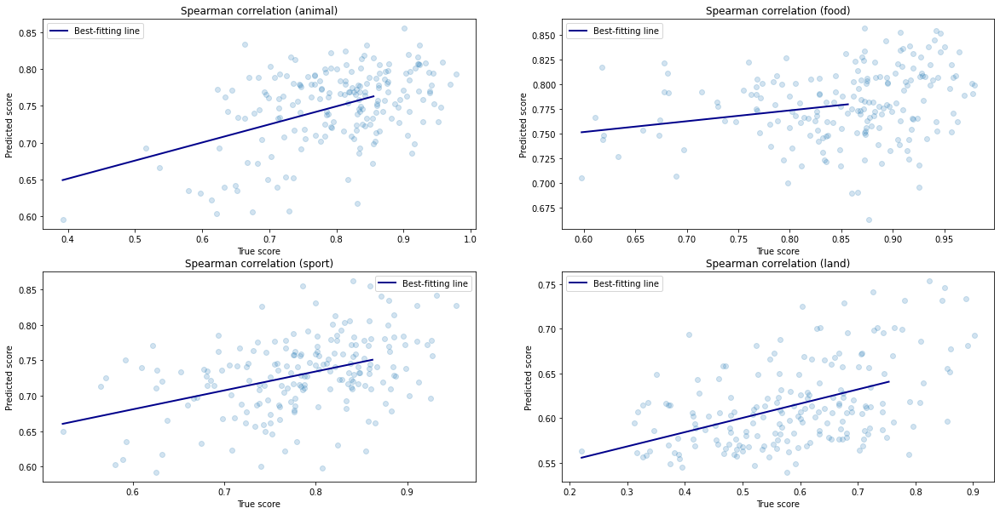

In [317]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
axes[0, 0].plot(x_values1, y_values1, color="#00008B", linewidth=2, label='Best-fitting line')
axes[0, 0].scatter(true_score_animal, pred_score_animal, cmap='viridis', alpha = 0.2)
axes[0, 0].legend()
axes[0, 0].set_title("Spearman correlation (animal)")
axes[0, 1].plot(x_values2, y_values2, color="#00008B", linewidth=2, label='Best-fitting line')
axes[0, 1].scatter(true_score_food, pred_score_food, cmap='viridis', alpha = 0.2)
axes[0, 1].legend()
axes[0, 1].set_title("Spearman correlation (food)")
axes[1, 0].plot(x_values3, y_values3, color="#00008B", linewidth=2, label='Best-fitting line')
axes[1, 0].scatter(true_score_sport, pred_score_sport, cmap='viridis', alpha = 0.2)
axes[1, 0].legend()
axes[1, 0].set_title("Spearman correlation (sport)")
axes[1, 1].plot(x_values4, y_values4, color="#00008B", linewidth=2, label='Best-fitting line')
axes[1, 1].scatter(true_score_land, pred_score_land, cmap='viridis', alpha = 0.2)
axes[1, 1].legend()
axes[1, 1].set_title("Spearman correlation (land)")
for ax in axes.flat:
    ax.set(xlabel='True score', ylabel='Predicted score')

## Geiger-Balas Dataset 

In [ ]:
test_dl_faces = DataLoader(test_faces, 8, shuffle=True, pin_memory=True, drop_last=True)

In [ ]:
epf = 20

In [ ]:
pbar = tqdm(enumerate(test_dl_faces), total=len(test_dl_faces))
test_losses_faces = []
labels_faces = []
prediction_faces = []
print("Beginning testing ...")
 
for epoch in range(epf):
    model.eval()
    for batch_ndx, (images, score) in pbar:
        with torch.no_grad():
            labels_faces.append(score)
            images = images.to(device) # -- 
            score = score.to(device) # -- 

            y_pred, lab = model(images)
            prediction_faces.append(y_pred.squeeze())
            
        
            loss = loss_fn(y_pred.squeeze(),score)
        
            test_losses_faces.append(loss)

  0%|          | 0/6 [00:00<?, ?it/s]

Beginning testing ...


100%|██████████| 6/6 [00:09<00:00,  1.56s/it]


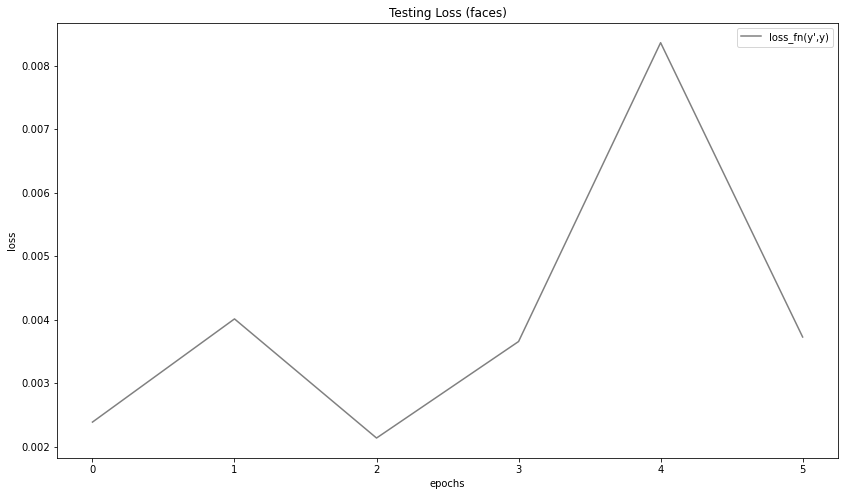

In [ ]:
plt.figure(figsize=(14, 8))
plt.plot([x for x in range(6)], [x.cpu().detach().numpy() for x in  test_losses_faces], c = "grey", label = r"loss_fn(y',y)")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title("Testing Loss (faces)")
plt.legend()

In [ ]:
lst = [x.cpu().detach().numpy() for x in  test_losses_faces]
np.mean(lst)

48
48
Spearman correlation: -0.05792145101244317
p-value: 0.7269064016003222


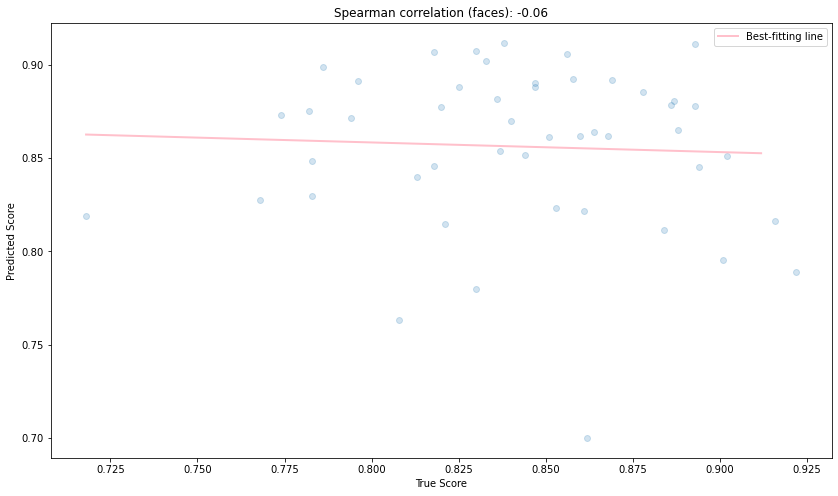

In [ ]:
true_score_faces = []
for batch in labels_faces:
    for score in batch:
        true_score_faces.append(score.item())
print(len(true_score_faces))

pred_score_faces = []
for batch in prediction_faces:
    for score in batch:
        pred_score_faces.append(score.item())
print(len(pred_score_faces))

correlation_face, p_value_face = spearmanr(true_score_faces,pred_score_faces)
slopeface, interceptface, r_valueface, p_value_face, std_errface = linregress(true_score_faces,pred_score_faces)
print("Spearman correlation:", correlation_face)
print("p-value:", p_value_face)
x_values_face = np.linspace(np.min(true_score_faces), np.max(pred_score_faces), 100)
y_values_face = slopeface * x_values_face + interceptface
plt.figure(figsize=(14, 8))
plt.plot(x_values_face, y_values_face, color="pink", linewidth=2, label='Best-fitting line')
plt.scatter(true_score_faces, pred_score_faces, cmap='Pastel1', alpha = 0.2)
# Add labels and title
plt.xlabel("True Score")
plt.ylabel("Predicted Score")
plt.title(f"Spearman correlation (faces): {correlation_face:.2f}")
plt.legend()
plt.show()

# Extracting Weights

In [74]:
num_train_samples = 2999
sample_ds = Subset(test_object, np.arange(num_train_samples)) #Sampling first 999 images from the test data

In [75]:
test_dataloader_sampled = DataLoader(sample_ds, 1, shuffle=False, pin_memory=True, drop_last=True)

In [76]:
pbar = tqdm(enumerate(test_dataloader_sampled), total=len(test_dataloader_sampled))
test_losses = []
print("Beginning testing ...")
layers = []
scores = []
predictions = []
 
model = model.to("cpu")

for epoch in range(epochs):
    model.eval()
    for batch_ndx, (images, score) in pbar:
        with torch.no_grad():
            
            scores.append(score)    
            
            images = images#.to(device) # -- 
            score = score#.to(device) # -- 

            y_pred, res = model(images)

            loss = loss_fn(y_pred.squeeze(),score)
            predictions.append(y_pred.squeeze())
            layers.append(res)
            
            test_losses.append(loss)

  0%|          | 0/2999 [00:00<?, ?it/s]

Beginning testing ...


c:\Users\Spark\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\modules\loss.py:520: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
100%|██████████| 2999/2999 [20:55<00:00,  2.39it/s]  


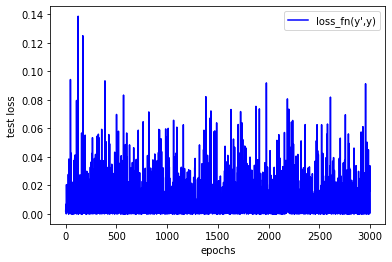

In [77]:
plt.plot([x for x in range(2999)], [x.cpu().detach().numpy() for x in test_losses], c = "blue", label = r"loss_fn(y',y)")
plt.xlabel("epochs")
plt.ylabel("test loss")
plt.legend()

In [78]:
def aggregate(tensor, scalar):
    tensor_mean = torch.mean(tensor) #interm output  
    agg = torch.mean((tensor - tensor_mean) * (scalar)) # Since "scalar" is a constant, its mean is the same value
    return agg

In [81]:
aggregate_array = np.empty((9, 2999))

for j in range(len(layers)):
    cov_layer = []
    scalar = predictions[j]
    for i in range(len(layers[j])):
        agg = aggregate(layers[j][i], scalar)
        aggregate_array[i, j] = agg.item()

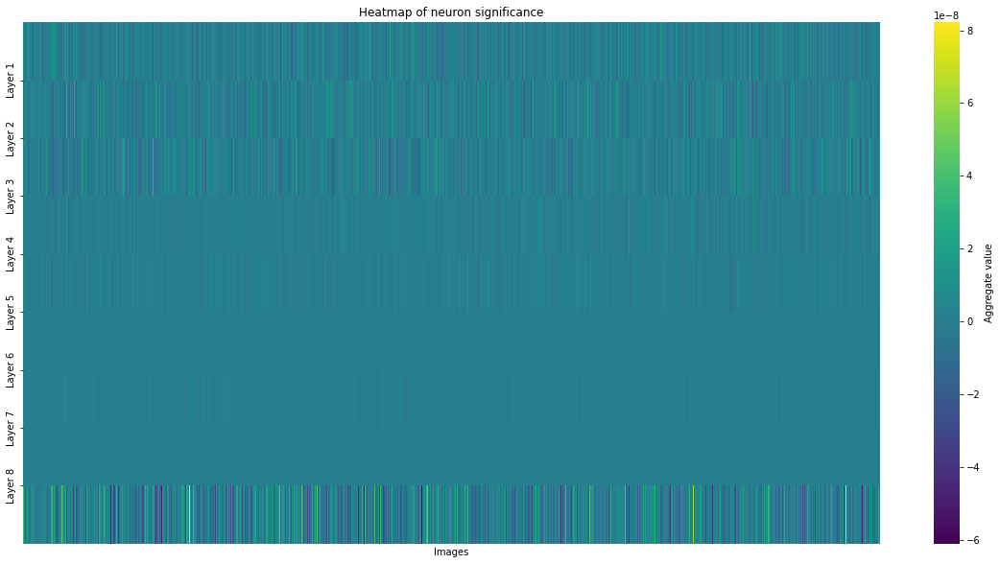

In [86]:
plt.figure(figsize=(20, 10))
sns.heatmap(aggregate_array, cmap='viridis', cbar_kws={'label': 'Aggregate value'})

# Set axis labels and title
plt.xlabel('Images')
plt.ylabel('')
plt.title('Heatmap of neuron significance')
y_ticks = np.arange(1, 9)
y_tick_labels = [f"Layer {i}" for i in y_ticks]
plt.yticks(y_ticks, y_tick_labels)
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)

# Show the heatmap
plt.savefig('HM.png', dpi=400)
plt.show()

In [299]:
plc_agg = aggregate_array.copy()
plc_agg = np.argsort(np.mean(abs(plc_agg), axis=1))

print("layer significance, in order:", plc_agg)

layer significance, in order: [5 7 6 3 4 0 1 2 8]


In [106]:
pbar = tqdm(enumerate(test_dataloader_sampled), total=len(test_dataloader_sampled))
test_losses_nores = []
print("Beginning testing ...")
layers = []
scores = []
predictions = []
 
model2 = model2.to("cpu")

for epoch in range(epochs):
    model.eval()
    for batch_ndx, (images, score) in pbar:
        with torch.no_grad():
            
            scores.append(score)    
            
            images = images#.to(device) # -- 
            score = score#.to(device) # -- 

            y_pred, res = model2(images)

            loss = loss_fn(y_pred.squeeze(),score)
            predictions.append(y_pred.squeeze())
            layers.append(res)
            
            test_losses_nores.append(loss)

  0%|          | 0/2999 [00:00<?, ?it/s]

Beginning testing ...


c:\Users\Spark\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\modules\loss.py:520: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
100%|██████████| 2999/2999 [11:02<00:00,  4.53it/s]


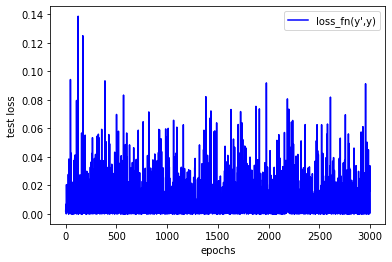

In [300]:
plt.plot([x for x in range(2999)], [x.cpu().detach().numpy() for x in test_losses], c = "blue", label = r"loss_fn(y',y)")
plt.xlabel("epochs")
plt.ylabel("test loss")
plt.legend()

In [108]:
aggregate_array_nores = np.empty((9, 2999))

for j in range(len(layers)):
    cov_layer = []
    scalar = predictions[j]
    for i in range(len(layers[j])):
        agg = aggregate(layers[j][i], scalar)
        aggregate_array_nores[i, j] = agg.item()

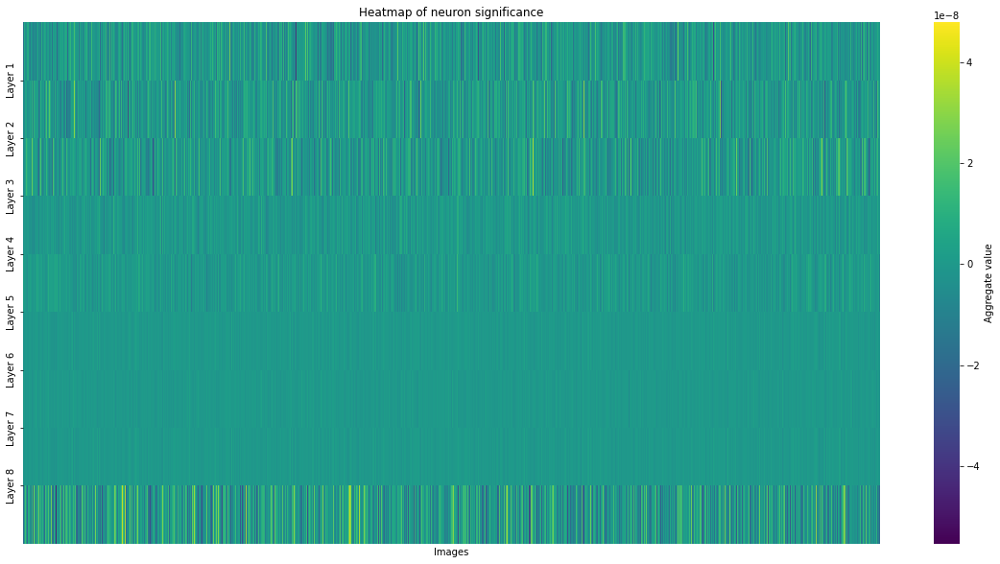

In [297]:
plt.figure(figsize=(20, 10))
sns.heatmap(aggregate_array_nores, cmap='viridis', cbar_kws={'label': 'Aggregate value'})

# Set axis labels and title
plt.xlabel('Images')
plt.ylabel('')
plt.title('Heatmap of neuron significance')
y_ticks = np.arange(1, 9)
y_tick_labels = [f"Layer {i}" for i in y_ticks]
plt.yticks(y_ticks, y_tick_labels)
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)

# Show the heatmap
plt.savefig('HM.png', dpi=400)
plt.show()

In [298]:
plc_agg = aggregate_array_nores.copy()
plc_agg = np.argsort(np.mean(abs(plc_agg), axis=1))

print("Layer significance, in order:", plc_agg)

Layer significance, in order: [6 5 7 3 4 0 2 1 8]


In [17]:
bw_pics_loader = DataLoader(test_object, 1, shuffle=True, pin_memory=True, drop_last=True)
pbar = tqdm(enumerate(bw_pics_loader), total=len(bw_pics_loader))

test_data = []

print("Beginning testing ...")

model.eval()
model = model.to("cpu")
for batch_ndx, (image, score) in pbar:
    with torch.no_grad():
        # labels.append(score)
        # image = image.to("cuda") # -- 
        # score = score.to("cuda") # -- 

        y_pred, lab = model(image)
        # prediction.append(y_pred.squeeze())
    
        loss = loss_fn(y_pred.squeeze(),score)
    
        test_data.append([score, image, loss])

        if batch_ndx == 1000:
            break

  0%|          | 0/9999 [00:00<?, ?it/s]

Beginning testing ...


c:\Users\Spark\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\modules\loss.py:520: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
 10%|█         | 1000/9999 [05:32<49:56,  3.00it/s] 


In [18]:
plc = test_data.copy()

dict = {}
for i in range(len(plc)):
    key = hash(plc[i][1])
    dict[key] = plc[i][1]
    plc[i][1] = key
    plc[i][0] = plc[i][0].detach().numpy()
    plc[i][2] = plc[i][2].detach().numpy()


In [19]:
for i in range(1, len(plc)):
    plc[i][0] = plc[i][0][0]

In [20]:
sorts = sorted(plc, key=lambda x: x[2], reverse = True)

In [21]:
worst_5 = [x[:2] for x in sorts[0:5]]
best_5 = [x[:2] for x in sorts[-6:-1]]

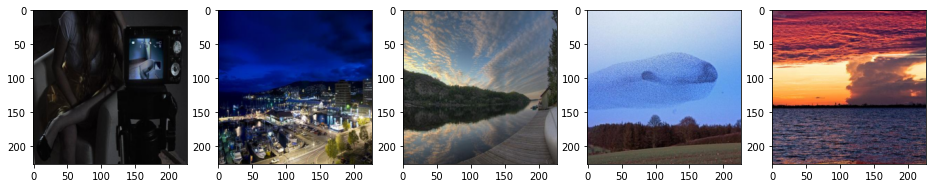

In [22]:
worst_5f, axarr = plt.subplots(1,5, figsize = (16,16))
axarr[0].imshow(dict[worst_5[0][1]].squeeze().permute(1,2,0))
axarr[1].imshow(dict[worst_5[1][1]].squeeze().permute(1,2,0))
axarr[2].imshow(dict[worst_5[2][1]].squeeze().permute(1,2,0))
axarr[3].imshow(dict[worst_5[3][1]].squeeze().permute(1,2,0))
axarr[4].imshow(dict[worst_5[4][1]].squeeze().permute(1,2,0))

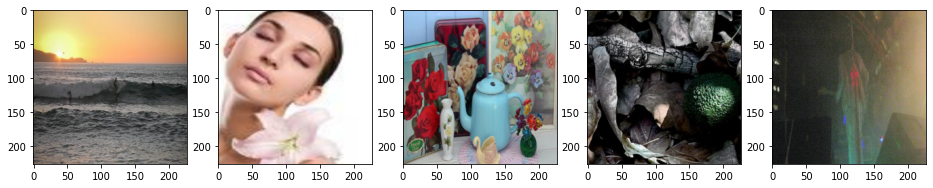

In [38]:
worst_5f, axarr = plt.subplots(1,5, figsize = (16,16))
axarr[0].imshow(dict[best_5[0][1]].squeeze().permute(1,2,0))
axarr[1].imshow(dict[best_5[1][1]].squeeze().permute(1,2,0))
axarr[2].imshow(dict[best_5[2][1]].squeeze().permute(1,2,0))
axarr[3].imshow(dict[best_5[3][1]].squeeze().permute(1,2,0))
axarr[4].imshow(dict[best_5[4][1]].squeeze().permute(1,2,0))

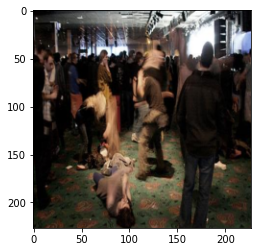

In [234]:
plt.imshow(dict[worst_5[0][1]].squeeze().permute(1,2,0))

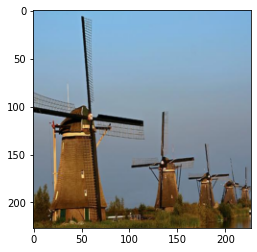

In [238]:
plt.imshow(dict[worst_5[1][1]].squeeze().permute(1,2,0))

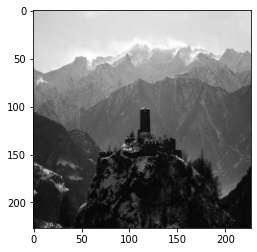

In [239]:
plt.imshow(dict[worst_5[2][1]].squeeze().permute(1,2,0))

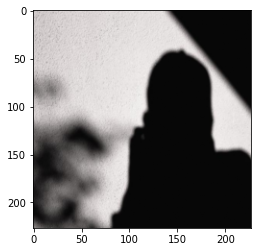

In [240]:
plt.imshow(dict[worst_5[3][1]].squeeze().permute(1,2,0))

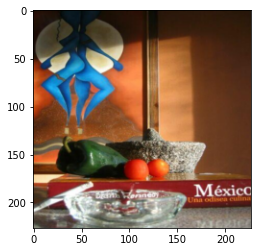

In [241]:
plt.imshow(dict[worst_5[4][1]].squeeze().permute(1,2,0))

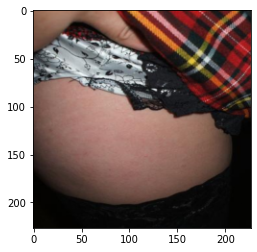

In [242]:
plt.imshow(dict[best_5[0][1]].squeeze().permute(1,2,0))

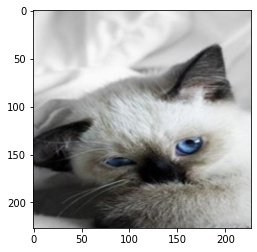

In [243]:
plt.imshow(dict[best_5[1][1]].squeeze().permute(1,2,0))

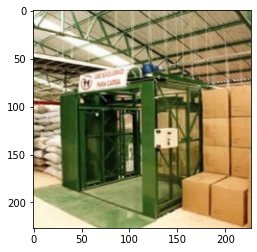

In [244]:
plt.imshow(dict[best_5[2][1]].squeeze().permute(1,2,0))

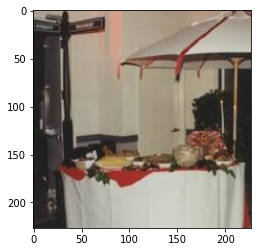

In [245]:
plt.imshow(dict[best_5[3][1]].squeeze().permute(1,2,0))

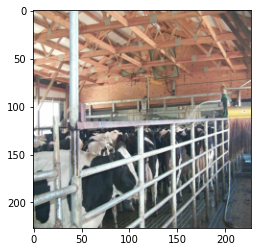

In [246]:
plt.imshow(dict[best_5[4][1]].squeeze().permute(1,2,0))

In [37]:
bw_pics_loader = DataLoader(test_object, 1, shuffle=True, pin_memory=True, drop_last=True)
pbar = tqdm(enumerate(bw_pics_loader), total=len(bw_pics_loader))

test_data_nores = []

print("Beginning testing ...")

model2.eval()
model2 = model2.to("cpu")
for batch_ndx, (image, score) in pbar:
    with torch.no_grad():
        # labels.append(score)
        # image = image.to("cuda") # -- 
        # score = score.to("cuda") # -- 

        y_pred, lab = model2(image)
        # prediction.append(y_pred.squeeze())
    
        loss = loss_fn(y_pred.squeeze(),score)
    
        test_data_nores.append([score, image, loss])

        if batch_ndx == 1000:
            break

  0%|          | 0/9999 [00:00<?, ?it/s]

Beginning testing ...


c:\Users\Spark\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\modules\loss.py:520: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
 10%|█         | 1000/9999 [03:14<29:10,  5.14it/s]


In [39]:
plc_nores= test_data_nores.copy()

dict_nores = {}
for i in range(len(plc_nores)):
    key = hash(plc_nores[i][1])
    dict_nores[key] = plc_nores[i][1]
    plc_nores[i][1] = key
    plc_nores[i][0] = plc_nores[i][0].detach().numpy()
    plc_nores[i][2] = plc_nores[i][2].detach().numpy()

In [278]:
float(plc_nores[1][2])

0.0016835040878504515

In [40]:
for i in range(1, len(plc_nores)):
    plc_nores[i][0] = plc_nores[i][0][0]

In [41]:
plc_nores[0][0] = plc_nores[0][0][0]

In [42]:
for i in range(1, len(plc_nores)):
    plc_nores[i][2] = float(plc_nores[i][2])

In [43]:
sorts = sorted(plc_nores, key=lambda x: x[2], reverse = True)

In [47]:
worst_5 = [x[:2] for x in sorts[0:5]]
best_5 = [x[:2] for x in sorts[len(sorts)-6:len(sorts)-1]]

In [255]:
worst_5[0][1].squeeze().shape

torch.Size([3, 227, 227])

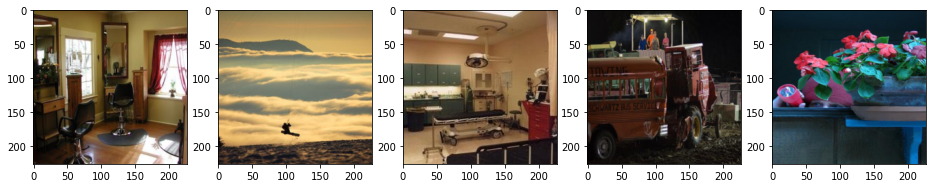

In [48]:
f, axarr = plt.subplots(1,5, figsize = (16,16))
axarr[0].imshow(dict_nores[worst_5[0][1]].squeeze().permute(1,2,0))
axarr[1].imshow(dict_nores[worst_5[1][1]].squeeze().permute(1,2,0))
axarr[2].imshow(dict_nores[worst_5[2][1]].squeeze().permute(1,2,0))
axarr[3].imshow(dict_nores[worst_5[3][1]].squeeze().permute(1,2,0))
axarr[4].imshow(dict_nores[worst_5[4][1]].squeeze().permute(1,2,0))

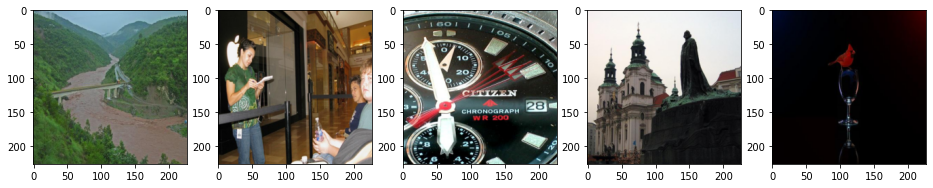

In [49]:
f, axarr = plt.subplots(1,5, figsize = (16,16))
axarr[0].imshow(dict_nores[best_5[0][1]].squeeze().permute(1,2,0))
axarr[1].imshow(dict_nores[best_5[1][1]].squeeze().permute(1,2,0))
axarr[2].imshow(dict_nores[best_5[2][1]].squeeze().permute(1,2,0))
axarr[3].imshow(dict_nores[best_5[3][1]].squeeze().permute(1,2,0))
axarr[4].imshow(dict_nores[best_5[4][1]].squeeze().permute(1,2,0))

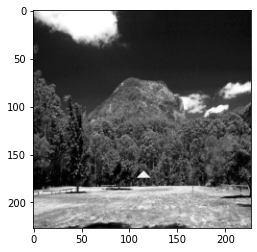

In [284]:
plt.imshow(dict_nores[worst_5[0][1]].squeeze().permute(1,2,0))

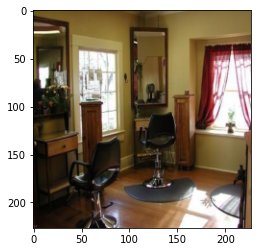

In [285]:
plt.imshow(dict_nores[worst_5[1][1]].squeeze().permute(1,2,0))

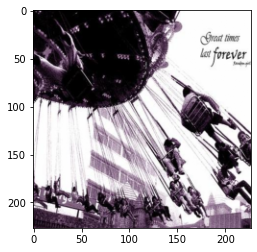

In [286]:
plt.imshow(dict_nores[worst_5[2][1]].squeeze().permute(1,2,0))

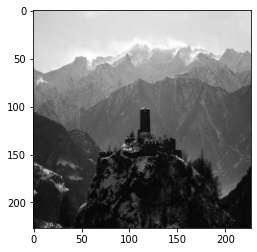

In [287]:
plt.imshow(dict_nores[worst_5[3][1]].squeeze().permute(1,2,0))

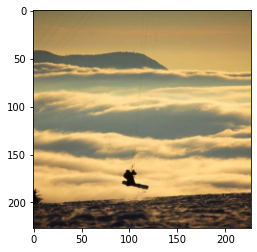

In [289]:
plt.imshow(dict_nores[worst_5[4][1]].squeeze().permute(1,2,0))

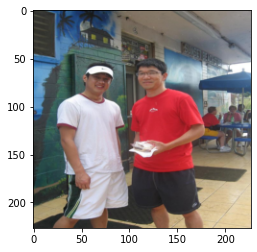

In [290]:
plt.imshow(dict_nores[best_5[0][1]].squeeze().permute(1,2,0))

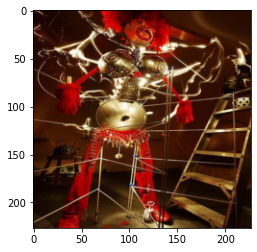

In [291]:
plt.imshow(dict_nores[best_5[1][1]].squeeze().permute(1,2,0))

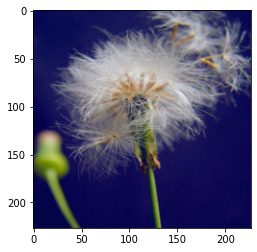

In [293]:
plt.imshow(dict_nores[best_5[2][1]].squeeze().permute(1,2,0))

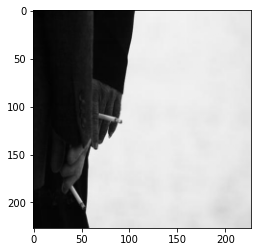

In [294]:
plt.imshow(dict_nores[best_5[3][1]].squeeze().permute(1,2,0))

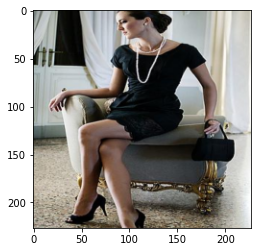

In [295]:
plt.imshow(dict_nores[best_5[4][1]].squeeze().permute(1,2,0))

# Unused Code

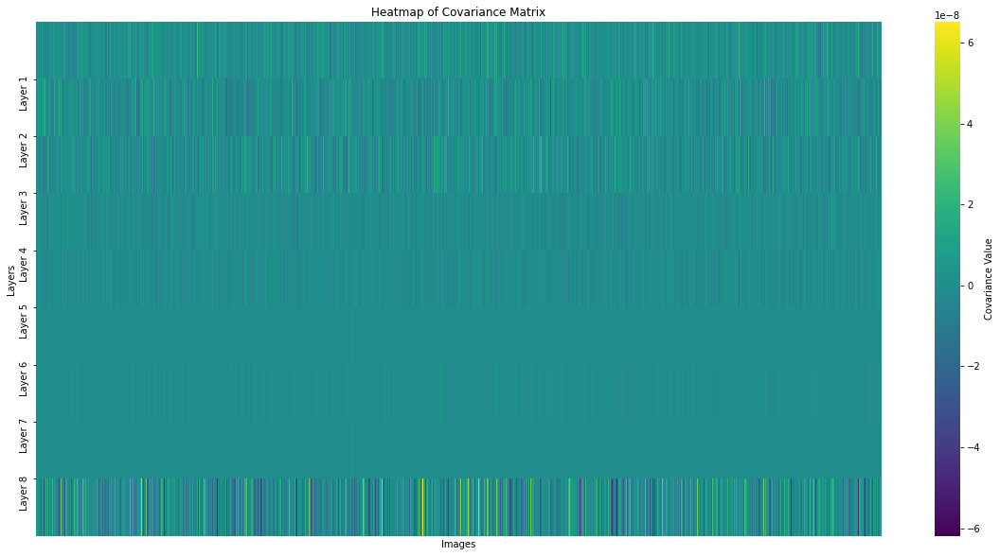

In [ ]:
plt.figure(figsize=(20, 10))
sns.heatmap(covariance_array, cmap='viridis', cbar_kws={'label': 'Covariance Value'})

# Set axis labels and title
plt.xlabel('Images')
plt.ylabel('Layers')
plt.title('Heatmap of Covariance Matrix')
y_ticks = np.arange(1, 9)
y_tick_labels = [f"Layer {i}" for i in y_ticks]
plt.yticks(y_ticks, y_tick_labels)
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)

# Show the heatmap
plt.savefig('HM.png', dpi=400)
plt.show()

In [ ]:
# Transpose the matrix so that each row represents an element
data = covariance_array[7:].T

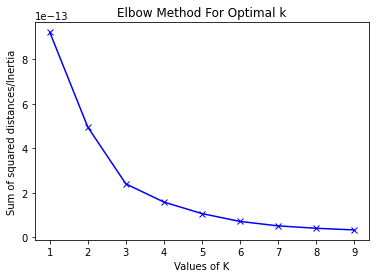

In [ ]:
#Choosing the number of clusters
Sum_of_squared_distances = []
K = range(1,10)
for num_clusters in K :
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(data)
    Sum_of_squared_distances.append(kmeans.inertia_)
plt.plot(K,Sum_of_squared_distances, "bx-")
plt.xlabel("Values of K") 
plt.ylabel("Sum of squared distances/Inertia") 
plt.title("Elbow Method For Optimal k")
plt.show()

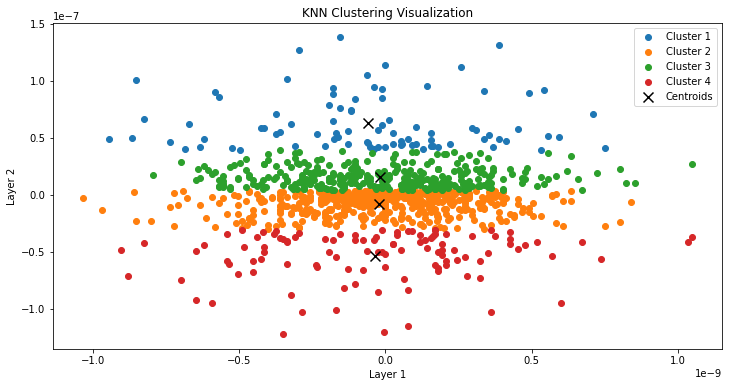

In [ ]:
# Number of clusters
n_clusters = 4

# Perform KMeans clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(data)

# Get the cluster labels
labels = kmeans.labels_

# Create a scatter plot for the first two dimensions
plt.figure(figsize=(12, 6))
for i in range(n_clusters):
    cluster_data = data[labels == i]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], label=f'Cluster {i + 1}')

# Add centroids to the plot
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], marker='x', c='black', s=100, label='Centroids')

# Set axis labels and title
plt.xlabel('Layer 1')#Colour-coded based on the memorability 
plt.ylabel('Layer 2')
plt.title('KNN Clustering Visualization')
plt.legend()

# Show the plot
plt.show()

In [ ]:
#print("All index value of 3 is: ", np.where(labels == 0)[0])
g = np.where(labels == 0)[0]
print(len(g))
f = np.where(labels == 1)[0]
print(len(f))
k = np.where(labels == 2)[0]
print(len(k))

87
474
328


In [ ]:
sample_ds_ = Subset(test_object, g)
test_dataloader_sampled = DataLoader(sample_ds_, 64, shuffle=True, pin_memory=True, drop_last=True) #Sampling first 999 images from the test data

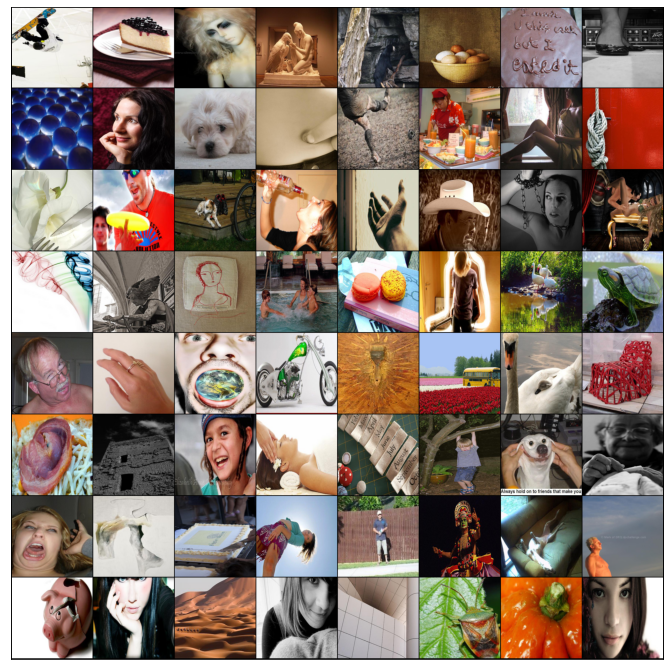

In [ ]:
show_batch(test_dataloader_sampled)

In [ ]:
sample_ds__ = Subset(test_object, f)
test_dataloader_sampled = DataLoader(sample_ds__, 64, shuffle=False, pin_memory=True, drop_last=True) 

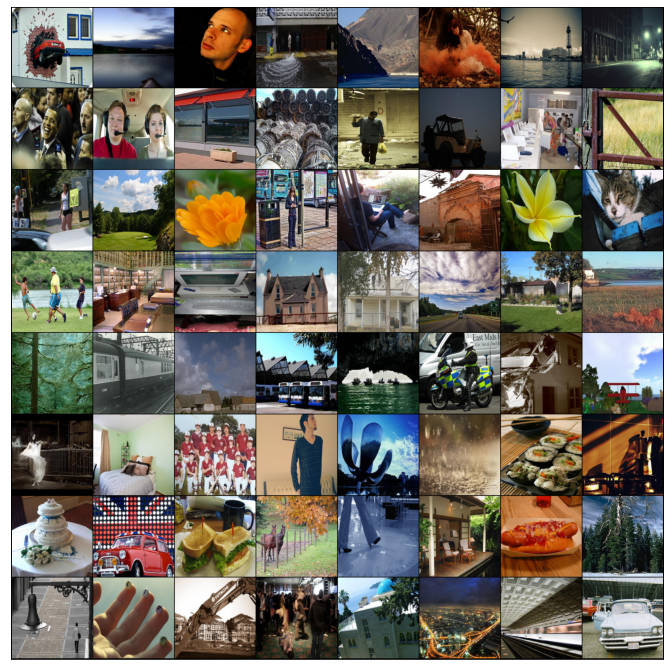

In [ ]:
show_batch(test_dataloader_sampled)

In [ ]:
sample_ds___ = Subset(test_object, k)
test_dataloader_sampled = DataLoader(sample_ds__, 64, shuffle=True, pin_memory=True, drop_last=True)

In [ ]:
r = np.where(labels == 3)[0]
print(len(r))

110


In [ ]:
sample_ds___ = Subset(test_object, r)
test_dataloader_sampled = DataLoader(sample_ds__, 64, shuffle=True, pin_memory=True, drop_last=True)

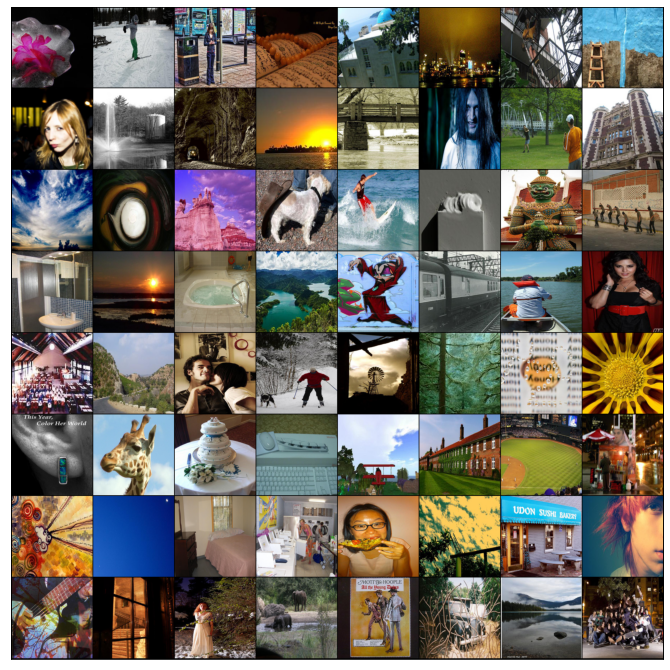

In [ ]:
show_batch(test_dataloader_sampled)

In [ ]:
data = covariance_array.T

In [ ]:
n_clusters = 4

# Perform KMeans clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(data)

# Get the cluster labels
labels = kmeans.labels_



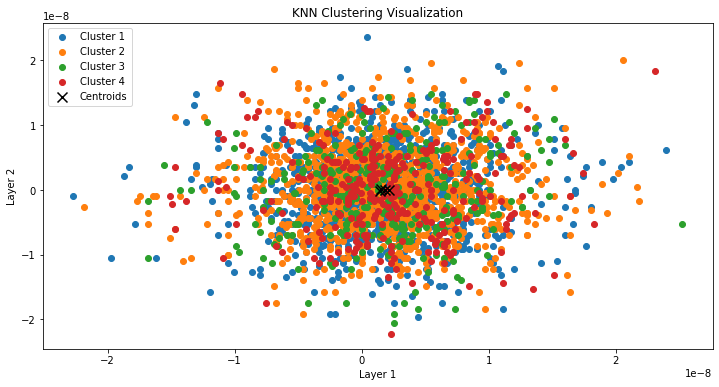

In [ ]:
# Number of clusters
n_clusters = 4

# Perform KMeans clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(data)

# Get the cluster labels
labels = kmeans.labels_

# Create a scatter plot for the first two dimensions
plt.figure(figsize=(12, 6))
for i in range(n_clusters):
    cluster_data = data[labels == i]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], label=f'Cluster {i + 1}')

# Add centroids to the plot
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], marker='x', c='black', s=100, label='Centroids')

# Set axis labels and title
plt.xlabel('Layer 1')#Colour-coded based on the memorability 
plt.ylabel('Layer 2')
plt.title('KNN Clustering Visualization')
plt.legend()

# Show the plot
plt.show()

In [ ]:
for j in range(len(layers)):
    cov_layer = []
    scalar = l[j]
    for i in range(len(layers[j])):
        cov = covariance(layers[j][i], scalar)
        covariance_array[i, j] = cov.item()